# GG4527- Urban Analytics: A Toolkit for Sustainable Urban Development Assignment 2
## Lab 5: Intro to Networks
-----


### Challenge 1


In [ ]:
import pandas as pd
import networkx as nx

FSdata = pd.read_csv("/Users/Lynsey/Documents/UA_GG4257/UA Repo/Week_5/Lab_5_Data/FS.csv") # read data

graph = nx.from_pandas_edgelist(FSdata, "source", "target") # extracting info


In [ ]:
print(len(graph))# size
print(graph.number_of_edges()) # indicates number of edges
print(type(graph.nodes())) # number of nodes
print(list(graph.edges(data=True))[-1]) # reads the attributes associated with the edges list. 
print(list(graph.nodes(data=True))[0]) # reads the attributes associated with the node list.
print(type(list(graph.edges(data=True))[-1][2])) # which type

In [ ]:
degree_centrality = nx.degree_centrality(graph) 
for node, centrality in degree_centrality.items():
    print(f"Node {node}: Degree Centrality = {centrality:.3f}")

# calculates degree of centrality for each node

To create histogram for the degree of centrality I am using the max and min values along the a log scale to show the histogram. This is because when creating the histogram I found there was only one value being shown which indicates very small differances. Therefore, the histiogram with log scale will show these differences clearer. 

In [ ]:
print(f"Min centrality: {min(centrality_values)}")
print(f"Max centrality: {max(centrality_values)}")

# finding min and max values 

In [ ]:
# creating histo

import numpy as np
import matplotlib.pyplot as plt

centrality_values = list(degree_centrality.values()) # getting values

plt.figure(figsize=(10, 6))
plt.hist(centrality_values, bins=np.logspace(np.log10(min(centrality_values)), np.log10(max(centrality_values)), 50), 
         color='skyblue', edgecolor='black')

plt.xscale("log") # x-axis

plt.title("Histogram of Degree Centrality (Log Scale)") # title
plt.xlabel("Degree Centrality (log scale)") # x-axis label
plt.ylabel("Number of Nodes") # y-axis label 
plt.grid(True)

plt.show()

screenshot

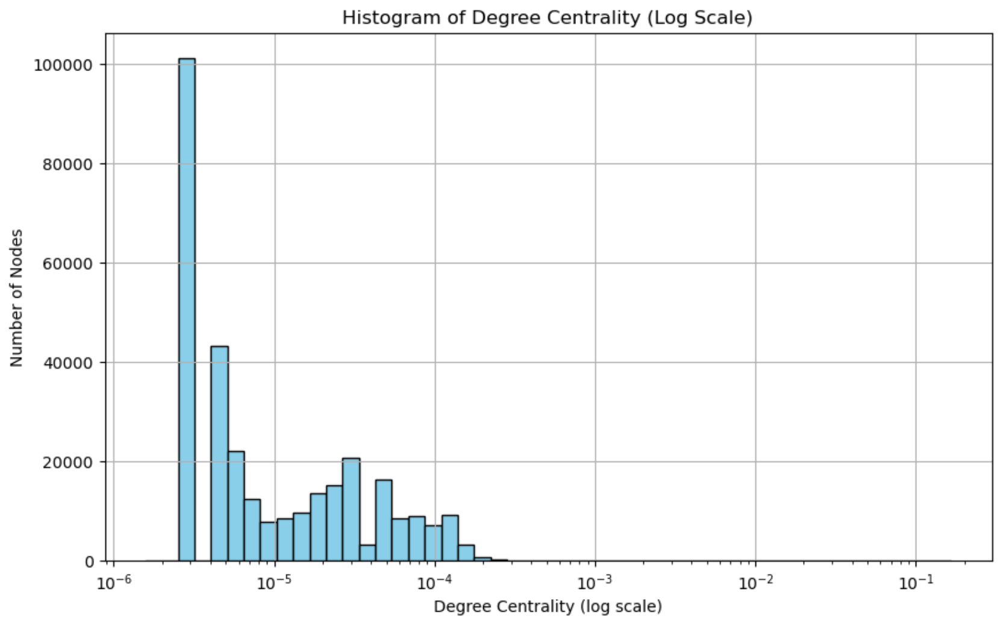

In [ ]:
# finding the top 4 nodes in the group to create subset 

graph_4 = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)[:4] 
print(graph_4)

In [ ]:
graph_4_node = [node for node, _ in graph_4] # extracting just the top 4 node ids

print("Top 4 nodes by degree centrality:", graph_4_node)

subgraph = graph.subgraph(graph_4_node).copy() # creating subset

print(f"Subgraph has {subgraph.number_of_nodes()} nodes and {subgraph.number_of_edges()} edges") # shows how many nodes and edges are in the sub group

import matplotlib.pyplot as plt
import networkx as nx

# creating graph 
nx.draw(subgraph, pos, with_labels=True, node_size=700, node_color="red", font_size=10, edge_color="gray")

plt.title("Subgraph of the Top 4 Most Central Nodes") # title
plt.show()


screenshot

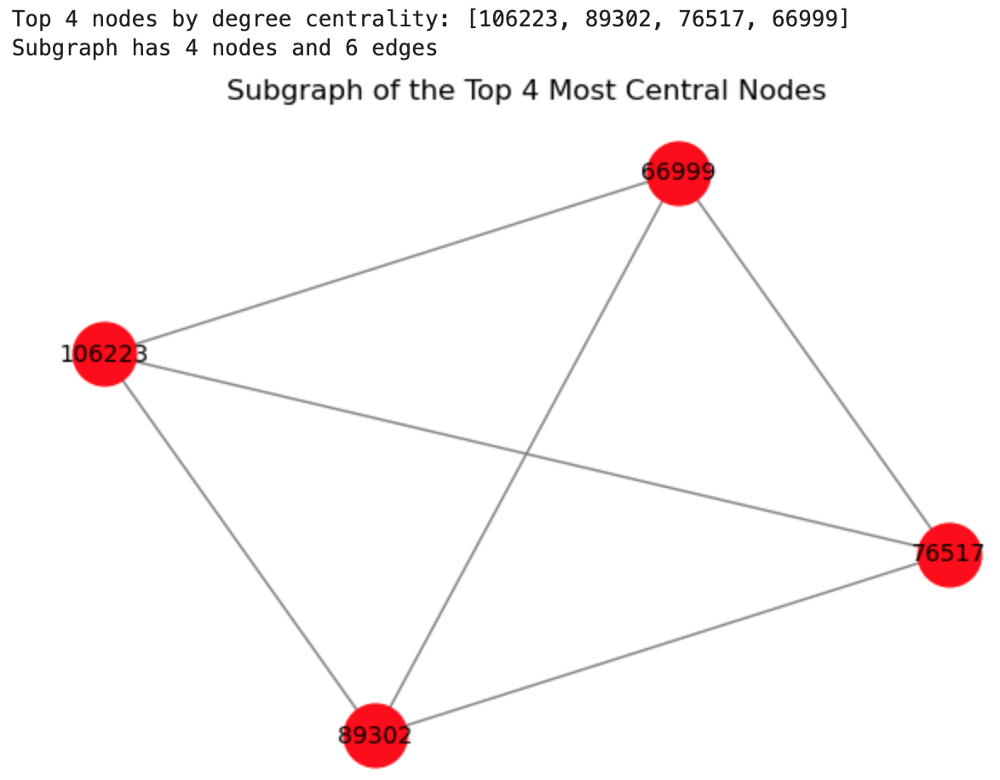

In [ ]:
betweenness_centrality = nx.betweenness_centrality(subgraph) # calculating betweenness centrality for sub group

betweenness_values = list(betweenness_centrality.values()) #converts to list which is used later 

print("Betweenness Centrality:", betweenness_centrality)  # prints values to show betweenness centrality for each of the top nodes


In [ ]:
# creating histo
plt.hist(betweenness_values, bins=20, color='skyblue', edgecolor='black')

plt.title("Histogram of Betweenness Centrality (Subset)") # title
plt.xlabel("Betweenness Centrality") # x-axis label
plt.ylabel("Number of Nodes")  # y-axis label 
plt.grid(True)

plt.show()

screenshot 

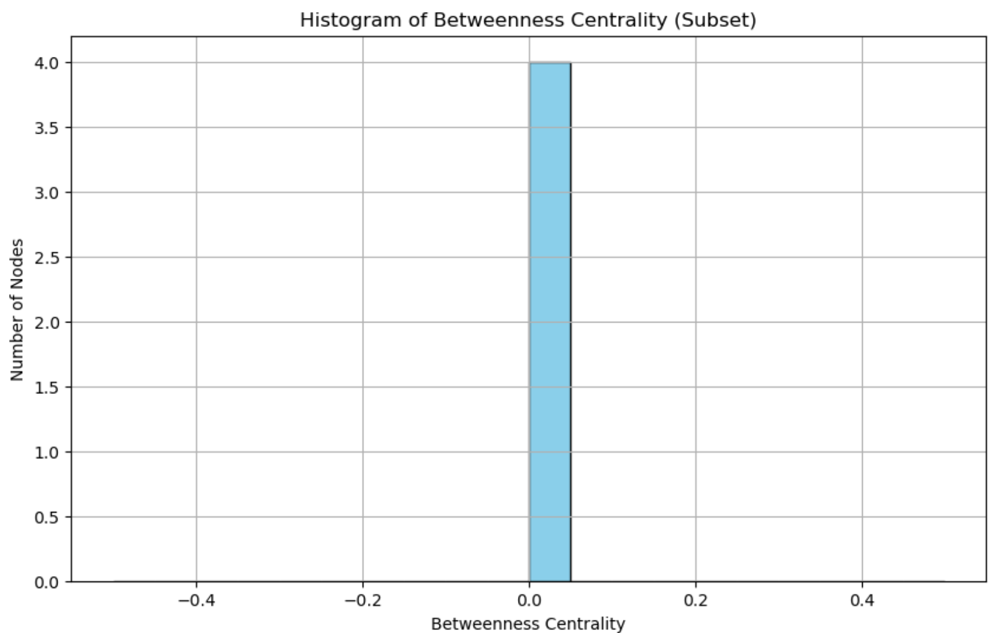

In [ ]:
# matrix plot of sub group
import nxviz as nv
nv.MatrixPlot(subgraph)
plt.title("Matrix Plot of the Subset")
plt.show()

screenshot 

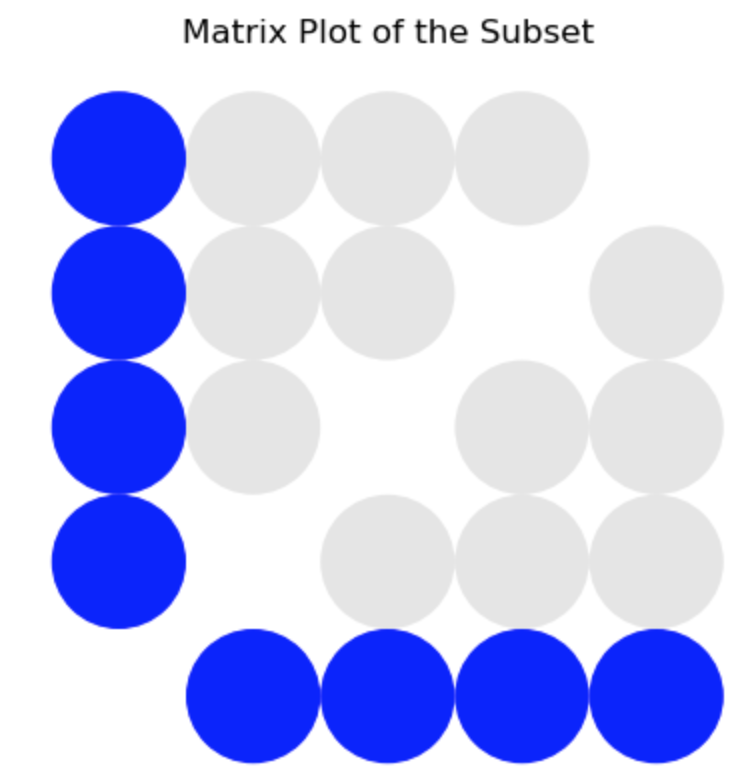

In [ ]:
# Arc plt of sub group 
nv.ArcPlot(subgraph)
plt.title("Arc Diagram of the Subset")
plt.show()

screenshot

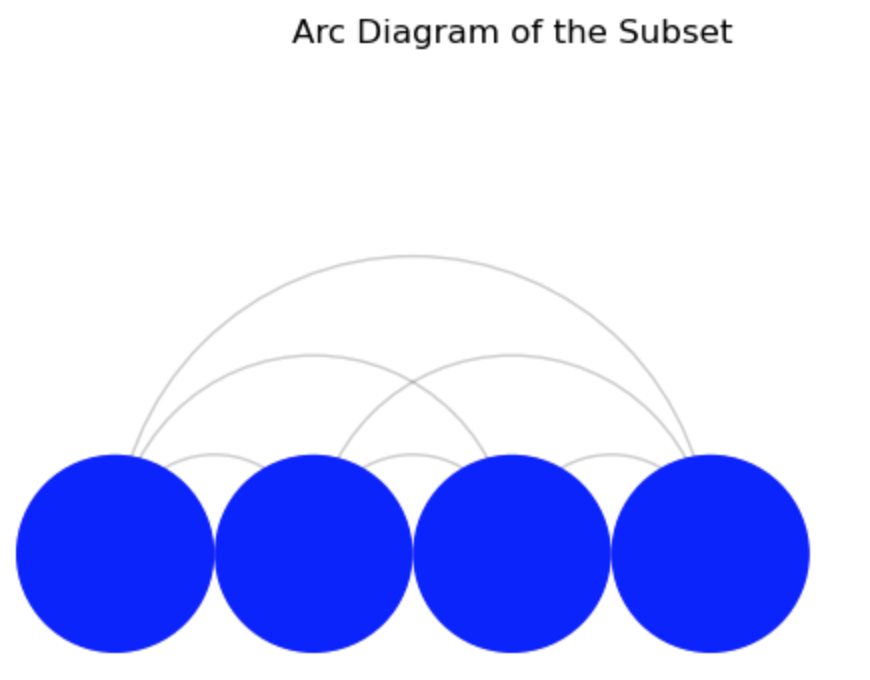

In [ ]:
# circos plot of sub group
nv.CircosPlot(subgraph)
plt.title("Circos Plot of the Subset")
plt.show()

screenshot 

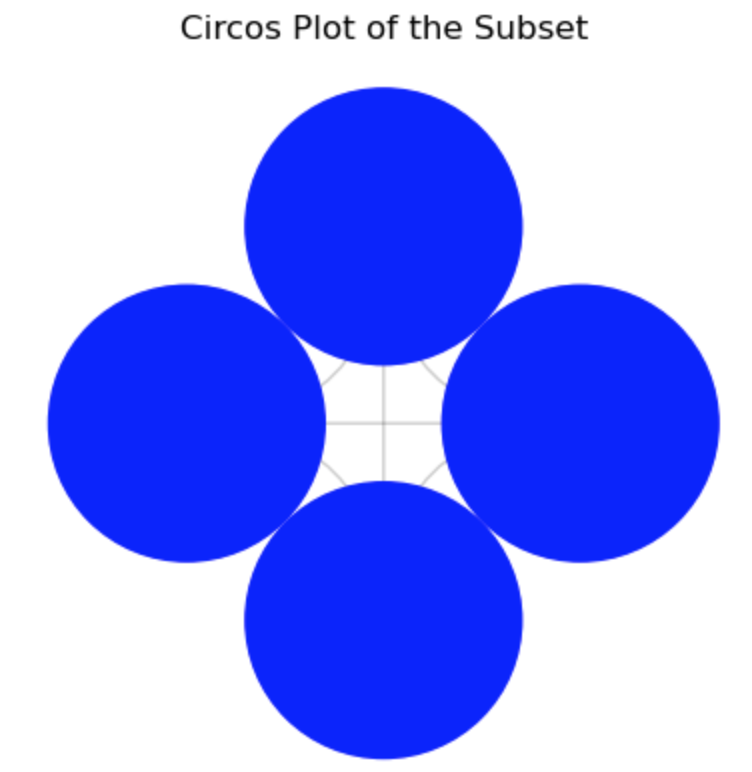


### Challenge 2


In [ ]:
import networkx as nx
import osmnx as ox

In [ ]:
G = ox.graph_from_place("Glasgow City", network_type="drive") # using glasgow as city of choice by name
fig, ax = ox.plot_graph(G)

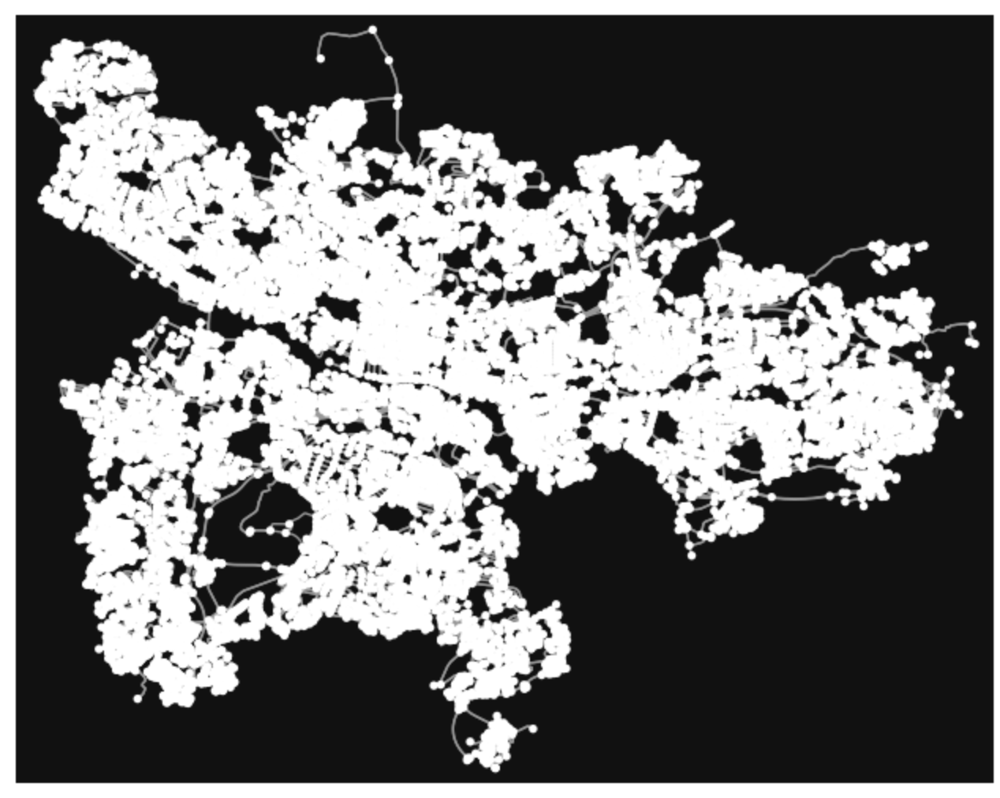

In [ ]:
# some simple stats

num_nodes = len(G.nodes) # number of nodes
num_edges = len(G.edges) # number of edges 

AND = sum(dict(G.degree()).values()) / num_nodes # average node degree

edge_length = [ox.distance.great_circle_vec(
    G.nodes[u]['y'], G.nodes[u]['x'], G.nodes[v]['y'], G.nodes[v]['x']) 
                for u, v, data in G.edges(data=True)] # calulating edge length using 
AEL = sum(edge_length) / len(edge_length) # calculating average edge length in meters

# printing results
print(f"Number of Nodes: {num_nodes}")
print(f"Number of Edges: {num_edges}")
print(f"Average Node Degree: {AND:.2f}")
print(f"Average Edge Length (m): {AEL:.2f}")


In [ ]:
G = ox.routing.add_edge_speeds(G)
G = ox.routing.add_edge_travel_times(G)

# adding speed and travel times to edges 

In [ ]:
import networkx as nx

# converting
gdf_nodes, gdf_edges = ox.utils_graph.graph_to_gdfs(G)
G = ox.utils_graph.graph_from_gdfs(gdf_nodes, gdf_edges, graph_attrs=G.graph)

# convert (again) to DiGraph in order to use nx.betweenness_centrality 
D = ox.utils_graph.get_digraph(G, weight="travel_time")

# calculate node betweenness centrality, weighted by travel time
bc = nx.betweenness_centrality(D, weight="travel_time", normalized=True)
nx.set_node_attributes(G, values=bc, name="bc")

# plotting the graph and coloring nodes by betweenness centrality
nc = ox.plot.get_node_colors_by_attr(G, "bc", cmap="plasma")
fig, ax = ox.plot.plot_graph(
    G, bgcolor="k", node_color=nc, node_size=50, edge_linewidth=2, edge_color="#333333"
)

screenshot



In [ ]:
# routing from the west end of glasgow to the east end of glasgow 
orig = ox.distance.nearest_nodes(G, 55.8745, -4.2922) # rough co ords for west end (kelvinside area)
dest = ox.distance.nearest_nodes(G, 55.843517, -4.130091) # rough co ords for east end (mount vernon)

In [ ]:
route = ox.shortest_path(G, orig, dest, weight="travel_time") 


In [ ]:
route = ox.shortest_path(G, orig, dest, weight="travel_time")
fig, ax = ox.plot_graph_route(G, route, node_size=0)


screen shot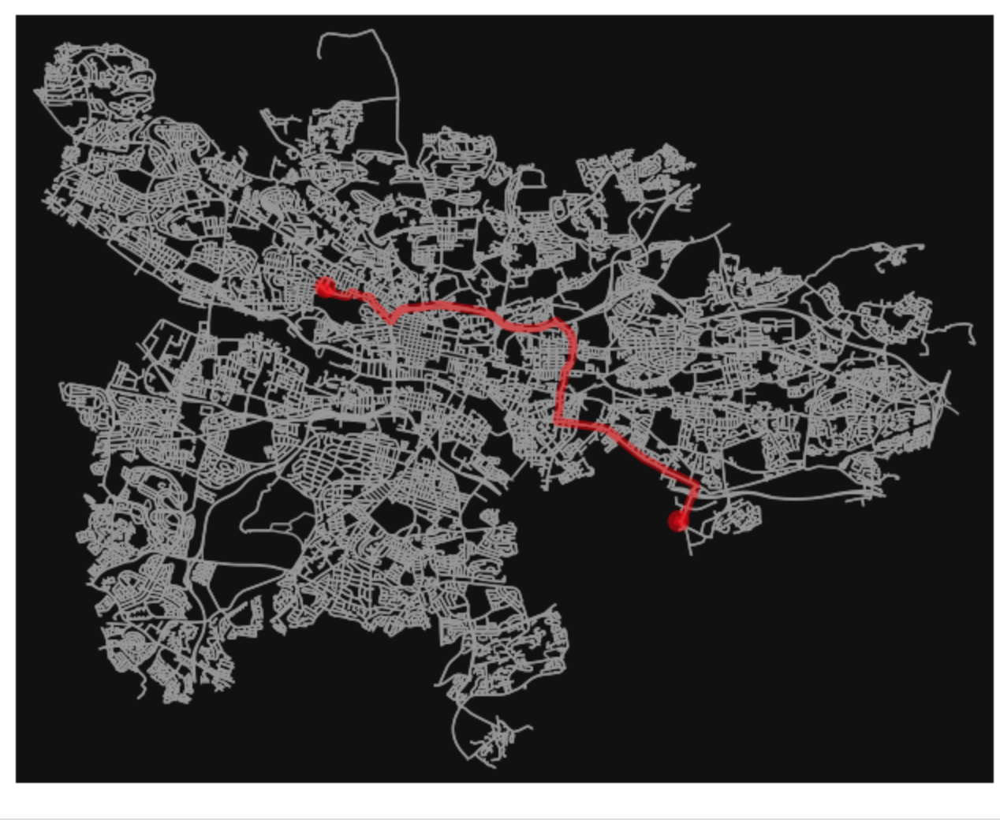

In [ ]:
# Figure ground diagramn of glasgow

import osmnx as ox
from IPython.display import Image

# configure the inline image display
img_folder = "images"
extension = "png"
size = 240
dpi = 40


In [ ]:
place = "Glasgow City Centre"
point = (55.860916, -4.251433) # using buchan galleries as the city centre
fp = f"./{img_folder}/{place}.{extension}"
fig, ax = ox.plot_figure_ground(
    point=point,
    network_type="drive",
    filepath=fp,
    dpi=dpi,
    save=True,
    show=False,
    close=True,
)
Image(fp, height=size, width=size)

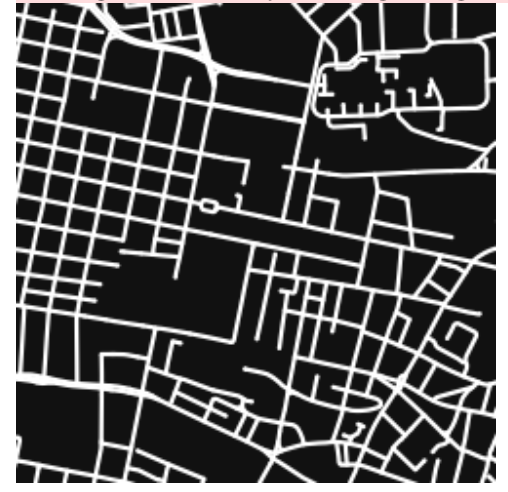

In [ ]:
## Interactive maps 
# edges

ox.graph_to_gdfs(G, nodes=False).explore() 

screenshot 

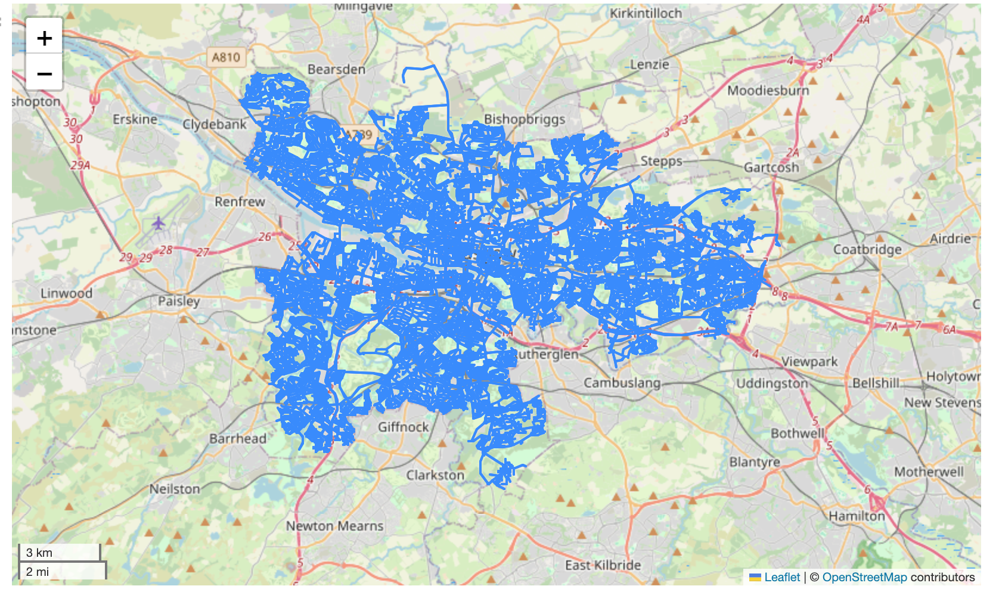

In [ ]:
# nodes

nodes = ox.graph_to_gdfs(G, edges=False)
nodes.explore(tiles="cartodbpositron", marker_kwds={"radius": 8})

screenshot 

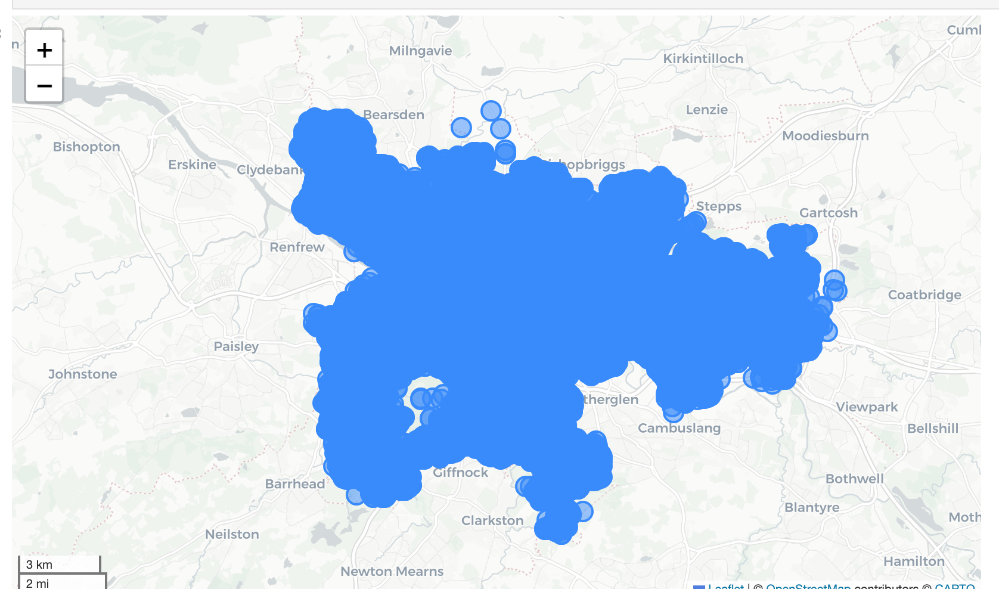

In [ ]:
# nodes and edges

nodes, edges = ox.graph_to_gdfs(G)
m = edges.explore(color="skyblue", tiles="cartodbdarkmatter")
nodes.explore(m=m, color="pink", marker_kwds={"radius": 6})

zoomed in screenshot 

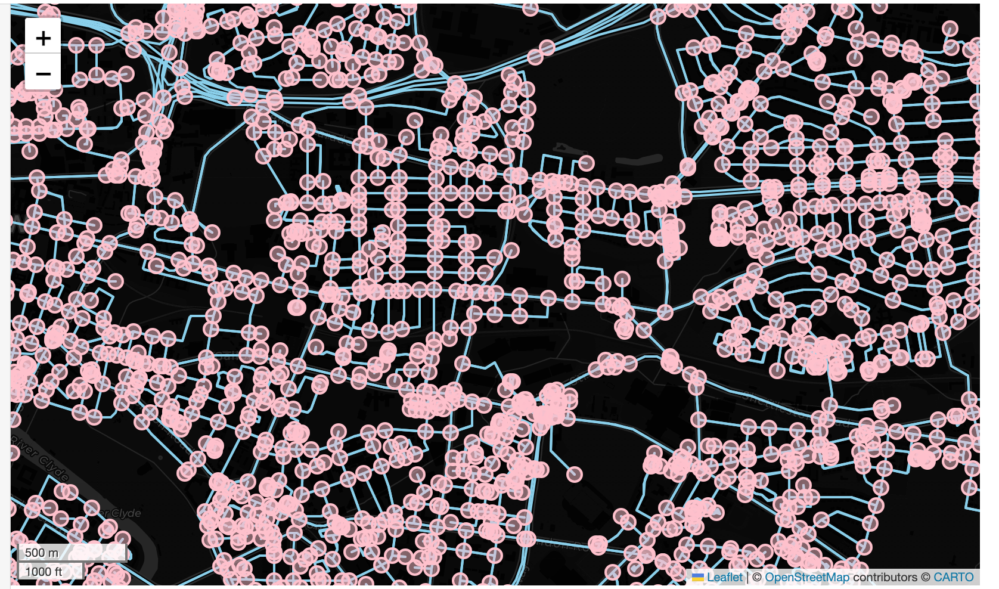

In [ ]:
# centrality

nx.set_node_attributes(G, nx.betweenness_centrality(G, weight="length"), name="bc")
nodes = ox.graph_to_gdfs(G, edges=False)
nodes.explore(tiles="cartodbdarkmatter", column="bc", marker_kwds={"radius": 8})

In [ ]:
# Saving graph 
ox.save_graph_geopackage(G, filepath="Assignment_2/mynetwork.gpkg")


In [ ]:
# code for obtaining interactive map after it has been saved
import geopandas as gpd

# replace file path with the same as above  
gdf = gpd.read_file("Assignment_2/mynetwork.gpkg")
gdf.explore()


In [ ]:
# getting buildings and parks from geometries from place 

G = ox.features_from_place("Glasgow City",tags={"building": True})
G.explore()

# there are too many building to process but this is the code ^ 
# therefore train stations and schools have been processed below

In [ ]:
G = ox.features_from_place("Glasgow City",tags={"railway": "station"})
G.explore()

# there are not as many train stations so rendering is much quicker

screen shot of train stations
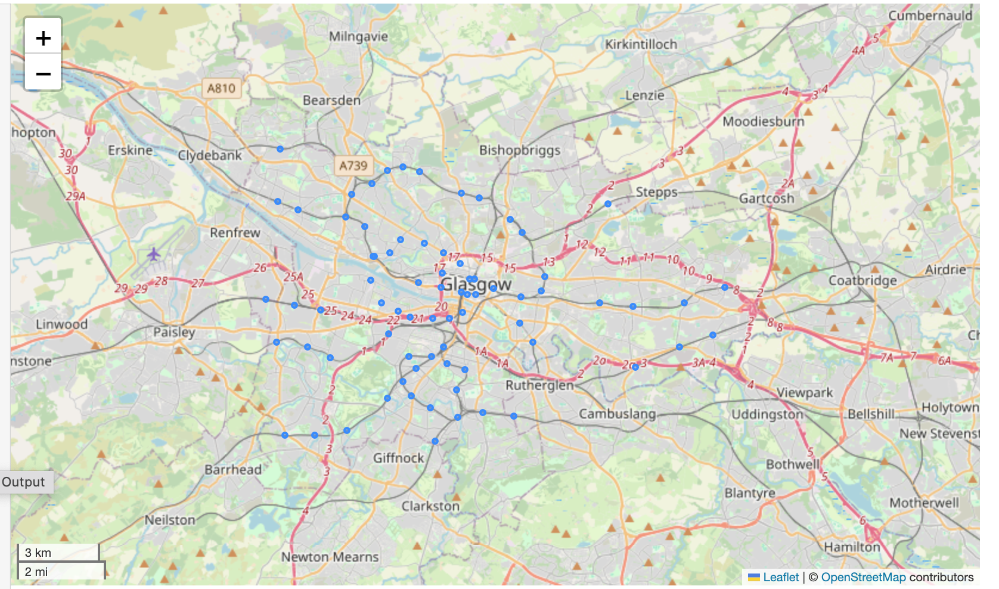

In [ ]:
G = ox.features_from_place("Glasgow City",tags={"amenity": ["school", "university", "college"]})
G.explore()

# here are schools, universities and colleges

screenshot

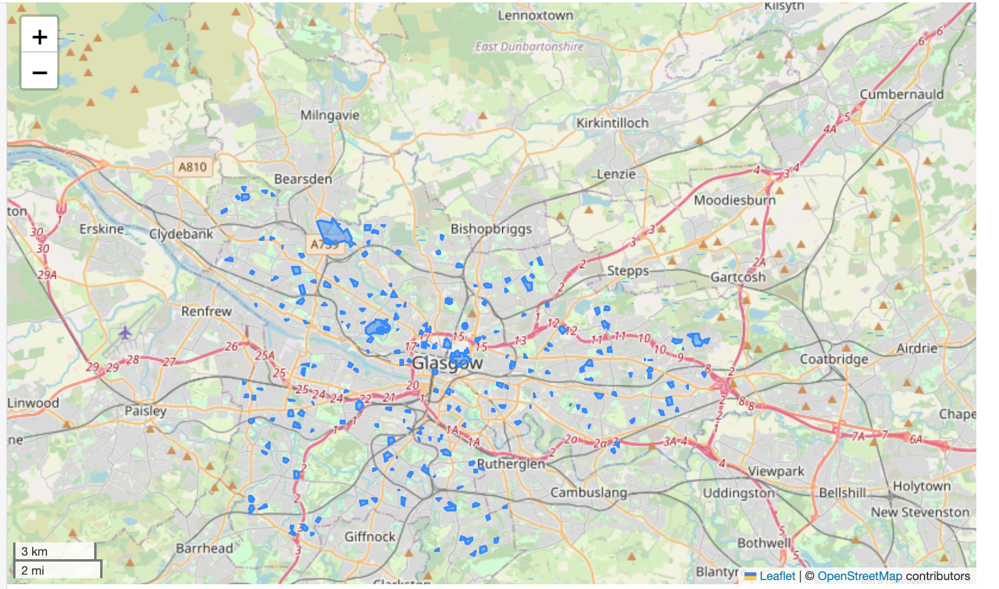

Referances:


Arnold, T. (2021). Graphing Networks with Pandas. Available at: https://pandas.pythonhumanities.com/04_02_graphing_networks_with_pandas.html (Accessed 21 March 2025).

Boeing, G. (n.d.). OSMnx Features Demo Notebook. Available at: https://github.com/gboeing/osmnx-examples/blob/main/notebooks/00-osmnx-features-demo.ipynb (Accessed 21 March 2025)

Boeing, G. (n.d.). OSMnx: User Reference. Available at: https://osmnx.readthedocs.io/en/stable/user-reference.html#module-osmnx.plot (Accessed 21 March 2025).

GeeksforGeeks. (2024). Calculate Great Circle Distances between Pairs of Points using osmnx module. Available at: https://www.geeksforgeeks.org/calculate-great-circle-distances-between-pairs-of-points-using-osmnx-module/ (Accessed 21 March 2025).

Ma, E. (n.d.). Network Analysis Made Simple – Practical: Input and Output. Available at: https://ericmjl.github.io/Network-Analysis-Made-Simple/03-practical/01-io/ (Accessed 21 March 2025).

Ma, E. (n.d.). nxviz: Examples Directory. Available at: https://github.com/ericmjl/nxviz/tree/master/examples (Accessed 21 March 2025).

NetworkX Developers. (n.d.). networkx.convert_matrix.from_pandas_edgelist. Available at: https://networkx.org/documentation/stable/reference/generated/networkx.convert_matrix.from_pandas_edgelist.html (Accessed 21 March 2025).

NetworkX Developers. (n.d.). Plot OSMnx graph from a GeoPandas GeoDataFrame. Available at: https://networkx.org/documentation/stable/auto_examples/geospatial/plot_osmnx.html (Accessed 21 March 2025).

Stack Overflow. (2017) Plotting a histogram on a log scale with matplotlib. Available at: https://stackoverflow.com/questions/47850202/plotting-a-histogram-on-a-log-scale-with-matplotlib (Accessed 21 March 2025).